# Supervised Regression with Multiple Variables
<hr>

## 0. Import library
<ht>

In [1]:
# Import libraries

# math library
import numpy as np

# visualization library
%matplotlib inline
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('png2x','pdf')
import matplotlib.pyplot as plt

# machine learning library
from sklearn.linear_model import LinearRegression

# 3d visualization
from mpl_toolkits.mplot3d import axes3d

# computational time
import time

## 1. Load dataset
<hr>

Load a set of data points $\{ (x_i, y_i, z_i) \}_{i=1}^n$ where $x_i$ and $y_i$ are considered as an input and $z_i$ is considered as an output for $i$-th data point.

In [2]:
# import data with numpy
data_clean = np.genfromtxt('data_clean.txt', delimiter=',')
data_noisy = np.genfromtxt('data_noisy.txt', delimiter=',')

data_clean = data_clean[:,0:3]  # do not change it
data_noisy = data_noisy[:,0:3]  # do not change it

# number of training data
n_clean = data_clean.shape
n_noisy = data_noisy.shape
print(n_clean,n_noisy)

(3600, 3) (3600, 3)


## 2. Explore the dataset distribution
<hr>

Plot the training data points in 3D cartesian coordinate system.
(You may use matplotlib function `scatter3D()`.)

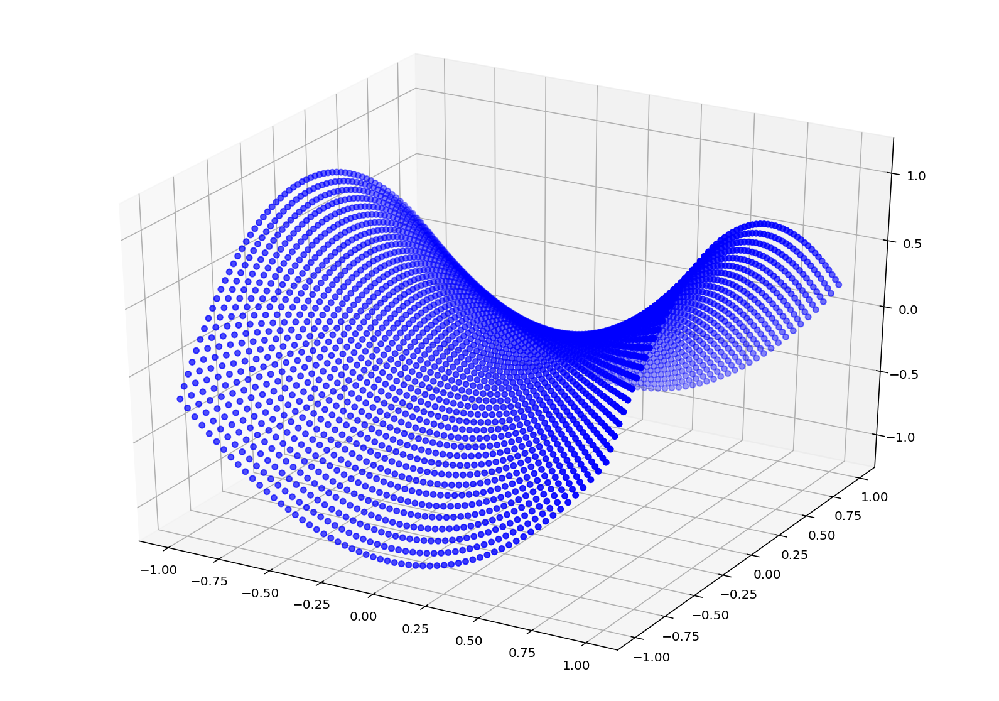

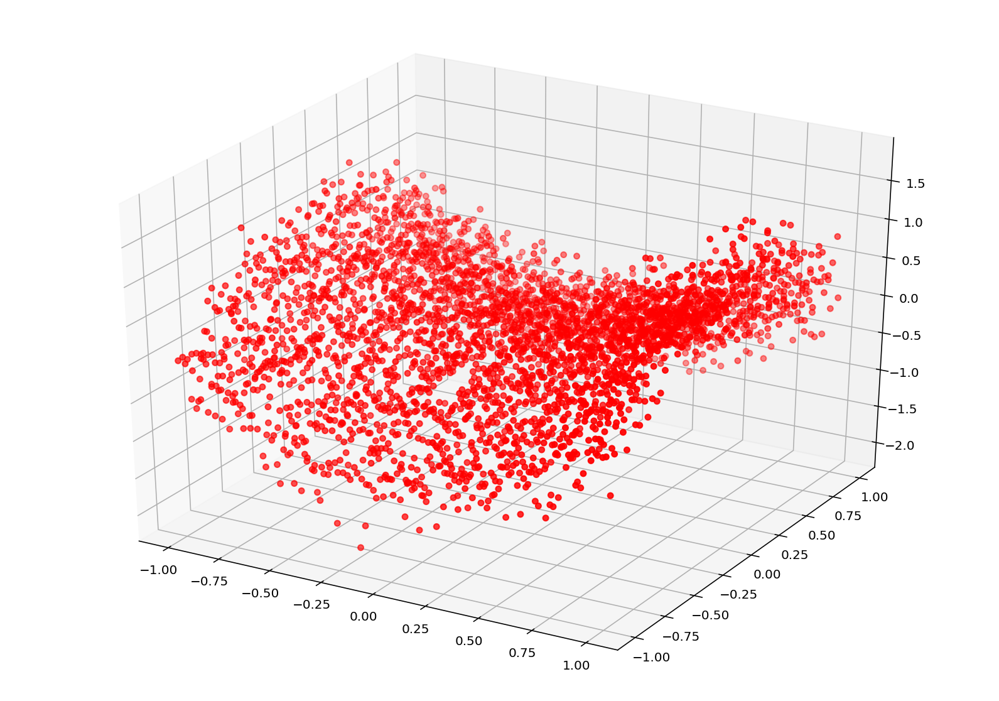

In [3]:
x_clean = data_clean[:,0]
y_clean = data_clean[:,1]
z_clean = data_clean[:,2]
fig1=plt.figure(figsize=(14,10))
ax1=plt.axes(projection="3d")
ax1.scatter3D(x_clean,y_clean,z_clean,c="blue")


x_train = data_noisy[:,0]
y_train = data_noisy[:,1]
z_train = data_noisy[:,2]
fig2=plt.figure(figsize=(14,10))
ax2=plt.axes(projection="3d")
ax2.scatter3D(x_train,y_train,z_train,c="red")

## 3. Define the prediction function 
<hr>
$$
f_w(x, y) = w_0 f_0(x, y) + w_1 f_1(x, y) + w_2 f_2(x, y) + w_3 f_3(x, y) + w_4 f_4(x, y) + w_5 f_5(x, y) + w_6 f_6(x, y) + w_7 f_7(x, y) + w_8 f_8(x, y) + w_9 f_9(x, y)
$$

where feature function $f$ is defined as follows:

$$
\begin{align*}
    f_0(x, y) &= \\
    f_1(x, y) &= \\
    f_2(x, y) &= \\
    f_3(x, y) &= \\
    f_4(x, y) &= \\
    f_5(x, y) &= \\
    f_6(x, y) &= \\
    f_7(x, y) &= \\
    f_8(x, y) &= \\
    f_9(x, y) &= 
\end{align*}
$$

### Vectorized implementation:

$$
f_w(x) = X w 
$$
with 
<br>
$$
X = 
\left[ 
\begin{array}{cccc}
f_0(x_1, y_1) & f_1(x_1, y_1) & f_2(x_1, y_1) & f_3(x_1, y_1) & f_4(x_1, y_1) & f_5(x_1, y_1) & f_6(x_1, y_1) & f_7(x_1, y_1) & f_8(x_1, y_1) & f_9(x_1, y_1) \\
f_0(x_2, y_2) & f_1(x_2, y_2) & f_2(x_2, y_2) & f_3(x_2, y_2) & f_4(x_2, y_2) & f_5(x_2, y_2) & f_6(x_2, y_2) & f_7(x_2, y_2) & f_8(x_2, y_2) & f_9(x_2, y_2) \\
\vdots\\
f_0(x_n, y_n) & f_1(x_n, y_n) & f_2(x_n, y_n) & f_3(x_n, y_n) & f_4(x_n, y_n) & f_5(x_n, y_n) & f_6(x_n, y_n) & f_7(x_n, y_n) & f_8(x_n, y_n) & f_9(x_n, y_n)
\end{array} 
\right]
\quad
\textrm{ and }
\quad
w = 
\left[ 
\begin{array}{cccc}
w_0 \\ 
w_1 \\
w_2 \\ 
w_3 \\ 
w_4 \\ 
w_5 \\
w_6 \\
w_7 \\
w_8 \\
w_9
\end{array} 
\right]
$$

Implement the vectorized version of the predictive function. <br>

In [34]:
x_train.shape

(3600,)

In [6]:
# construct data matrix


n = data_noisy.shape[0]
X = np.ones([n,10]) 
#bias term
#X[:,1]
# X[:,2] = x_train
# X[:,3] = y_train
# X[:,4] = x_train**2
# X[:,5] = x_train*y_train
# X[:,6] = y_train**2
# X[:,7] = x_train**3
# X[:,8] = y_train**3
# X[:,9] = x_train**2*y_train
X[:,2] = x_train
X[:,3] = y_train
X[:,4] = x_train**2
X[:,5] = y_train**2
X[:,6] = y_train**3
X[:,7] = x_train**3
X[:,8] = x_train**4
X[:,9] = y_train**4

print(X.shape)
# print(X)
# parameters vector
w = np.array([1,1,1,1,1,1,1,1,1,1])[:,None] # [:,None] adds a singleton dimension

# predictive function definition
def f_pred(X,w): 
    
    f = np.matmul(X,w)
    
    return f 

# Test predicitive function 
z_pred = f_pred(X,w)
print(z_pred)
print(z_pred.shape)
print(n)

(3600, 10)
[[ 2.        ]
 [ 1.93668129]
 [ 1.88187349]
 ...
 [ 9.3664312 ]
 [ 9.67229863]
 [10.        ]]
(3600, 1)
3600


## 4. Define the regression loss 
<hr>
$$
L(w)=\frac{1}{n} \sum_{i=1}^n \ \Big( f_w(x_i, y_i) – z_i \Big)^2
$$

### Vectorized implementation:

$$
L(w)=\frac{1}{n} (Xw-z)^T(Xw-z)
$$
with 
<br>
$$
Xw=
\left[ 
\begin{array}{cccc}
f_w(x_1, y_1) \\ 
f_w(x_2, y_2) \\ 
\vdots\\
f_w(x_n, y_n) \\ 
\end{array} 
\right]
\quad
\textrm{ and }
\quad
z = 
\left[ 
\begin{array}{cccc}
z_1 \\ 
z_2 \\ 
\vdots\\
z_n
\end{array} 
\right]
$$

Implement the vectorized version of the regression loss function. <br>


In [7]:
# loss function definition
def loss_mse(z_pred,z): 
    
    loss = np.matmul((z_pred-z).T,z_pred-z)/z.size
    
    return loss.item()


# Test loss function 
z = z_train.reshape(-1,1)# label
z_pred = f_pred(X,w)# prediction
print(z_pred.T.shape)
loss = loss_mse(z_pred,z)
print(loss)
print(z.size)

(1, 3600)
12.381734305974865
3600


## 5. Define the gradient of the regression loss 
<hr>

$\bullet$ Vectorized implementation: Given the loss

$$
L(w)=\frac{1}{n} (Xw-z)^T(Xw-z)
$$

The gradient is given by  

$$
\frac{\partial}{\partial w} L(w) = \frac{2}{n} X^T(Xw-z)
$$


Implement the vectorized version of the gradient of the regression loss function.

In [8]:
# gradient function definition
def grad_loss(z_pred,z,X):

    grad = np.matmul(X.T,z_pred-z)/z.size*2
    
    return grad


# Test grad function 
z_pred = f_pred(X,w)
grad = grad_loss(z_pred,z,X)
print(grad)

[[6.24051498]
 [6.24051498]
 [1.06259554]
 [1.07123348]
 [2.32119669]
 [2.69335635]
 [0.7086127 ]
 [0.70459986]
 [1.49744836]
 [1.82770809]]


## 6. Implement the gradient descent algorithm 
<hr>

### Vectorized implementation: 

$$
w^{k+1} = w^{k} - \tau  \frac{2}{n} X^T(Xw^{k}-z)
$$

Implement the vectorized version of the gradient descent function.

Plot the loss values $L(w^k)$ with respect to iteration $k$ the number of iterations.

Time= 0.7300176620483398
0.08848371416691528
[[-0.00170002]
 [-0.00170002]
 [ 0.02053483]
 [-0.00852468]
 [ 0.84019494]
 [-0.87015522]
 [ 0.11996304]
 [ 0.09331026]
 [ 0.16034914]
 [-0.11304247]]


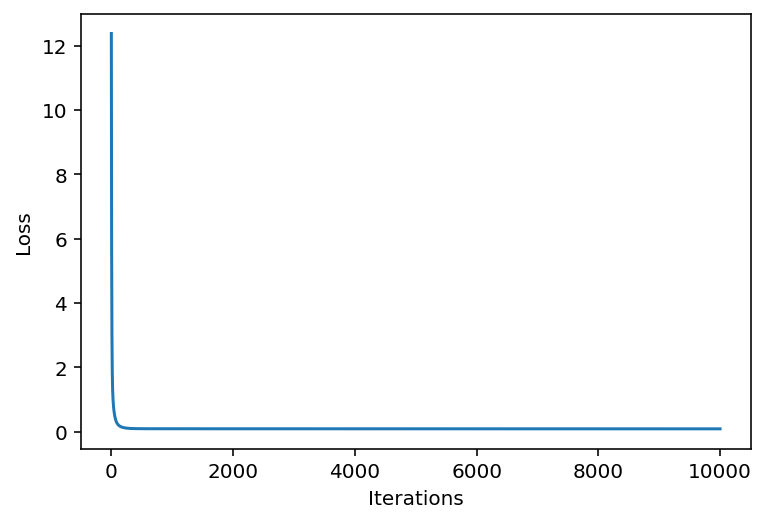

In [40]:
# gradient descent function definition
def grad_desc(X, z , w_init=np.array([0,0])[:,None] ,tau=0.01, max_iter=500):

    L_iters = np.zeros([max_iter]) # record the loss values
    w_iters = np.zeros([max_iter,10]) # record the loss values
    w = w_init # initialization
    
    for i in range(max_iter): # loop over the iterations
        
        z_pred = f_pred(X,w)# linear predicition function 
        grad_f = grad_loss(z_pred,z,X)# gradient of the loss 
        w = w-tau*grad_f# update rule of gradient descent
        L_iters[i] =  loss_mse(z_pred,z)# save the current loss value 
        w_iters[i,:] = w.reshape(10)# save the current w value 
        
    return w, L_iters, w_iters


# run gradient descent algorithm 
start = time.time()
w_init =  np.array([1,1,1,1,1,1,1,1,1,1])[:,None]
tau = 0.02
max_iter = 10000

w, L_iters, w_iters = grad_desc(X,z,w_init,tau,max_iter)

print('Time=',time.time() - start) # plot the computational cost
print(L_iters[max_iter-1] ) # plot the last value of the loss
print(w) # plot the last value of the parameter w 


# plot
plt.figure(2)
plt.plot(L_iters) # plot the loss curve
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()


## 7. Plot the prediction function
<hr>
$$
f_w(x, y) = w_0 f_0(x, y) + w_1 f_1(x, y) + w_2 f_2(x, y) + w_3 f_3(x, y) + w_4 f_4(x, y) + w_5 f_5(x, y) + w_6 f_6(x, y) + w_7 f_7(x, y) + w_8 f_8(x, y) + w_9 f_9(x, y)
$$

(You may use numpy function `meshgrid` and `plot_surface` for plot the linear prediction function.)

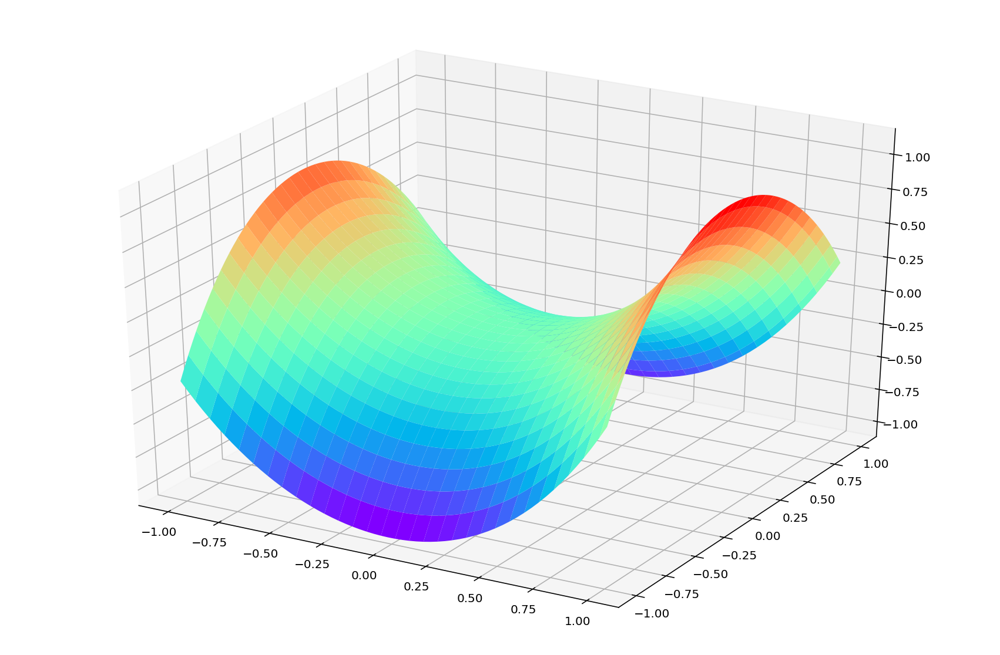

In [41]:
x_coordinate = np.linspace(-1, 1, 60) 
y_coordinate = np.linspace(-1, 1, 60) 
def data_to_X(x,y):
    n=x.size
    X = np.ones([n,10]) 
    #bias term
    #X[:,1]
    X[:,2] = x
    X[:,3] = y
    X[:,4] = x**2
    X[:,5] = y**2
    X[:,6] = x**3
    X[:,7] = y**3
    X[:,8] = x**4
    X[:,9] = y**4
    return X
x_pred, y_pred = np.meshgrid(x_coordinate, y_coordinate, indexing='xy')
x_flat=x_pred.reshape(1,-1)
y_flat=y_pred.reshape(1,-1)
X_flat=data_to_X(x_flat,y_flat)
z_pred=f_pred(X_flat,w)
# plot
fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot(1, 1, 1, projection='3d')
ax.plot_surface(x_pred,y_pred,z_pred.reshape(60,60),cmap=plt.cm.rainbow)

## 8. Plot the prediction function superimposed on the training data
<hr>

(-1.0, 1.0)

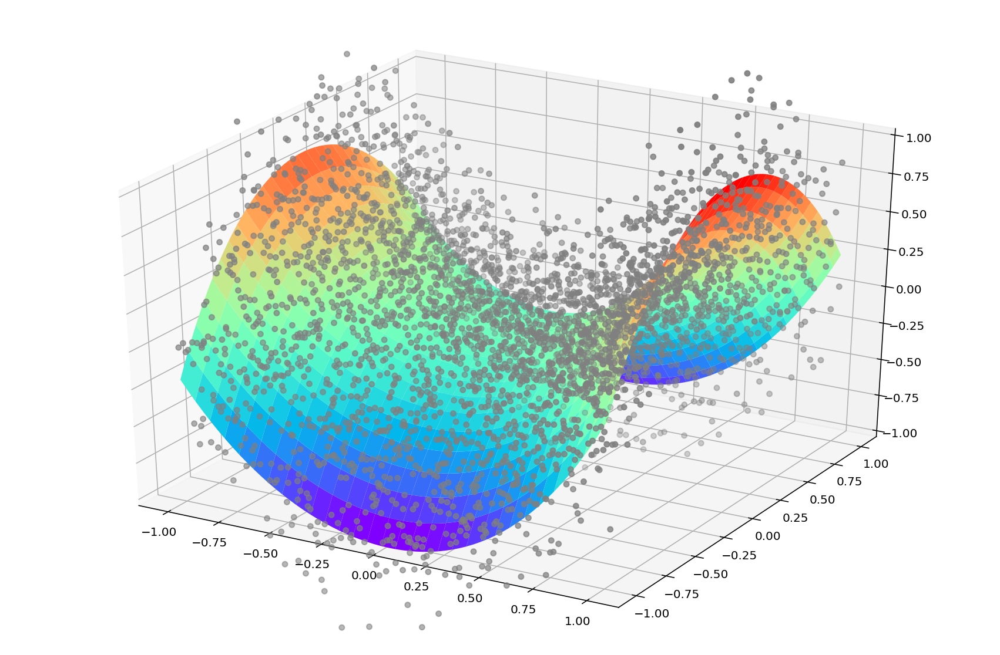

In [42]:
x_coordinate = np.linspace(-1, 1, 60) 
y_coordinate = np.linspace(-1, 1, 60) 

x_pred, y_pred = np.meshgrid(x_coordinate, y_coordinate, indexing='xy')

# plot
fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot(1, 1, 1, projection='3d')
ax.plot_surface(x_pred,y_pred,z_pred.reshape(60,60),cmap=plt.cm.rainbow)
ax.scatter3D(x_train,y_train,z_train,c="gray")
ax.set_zlim(-1,1)

# Output results

## 1. Plot the clean data in 3D cartesian coordinate system (1pt)

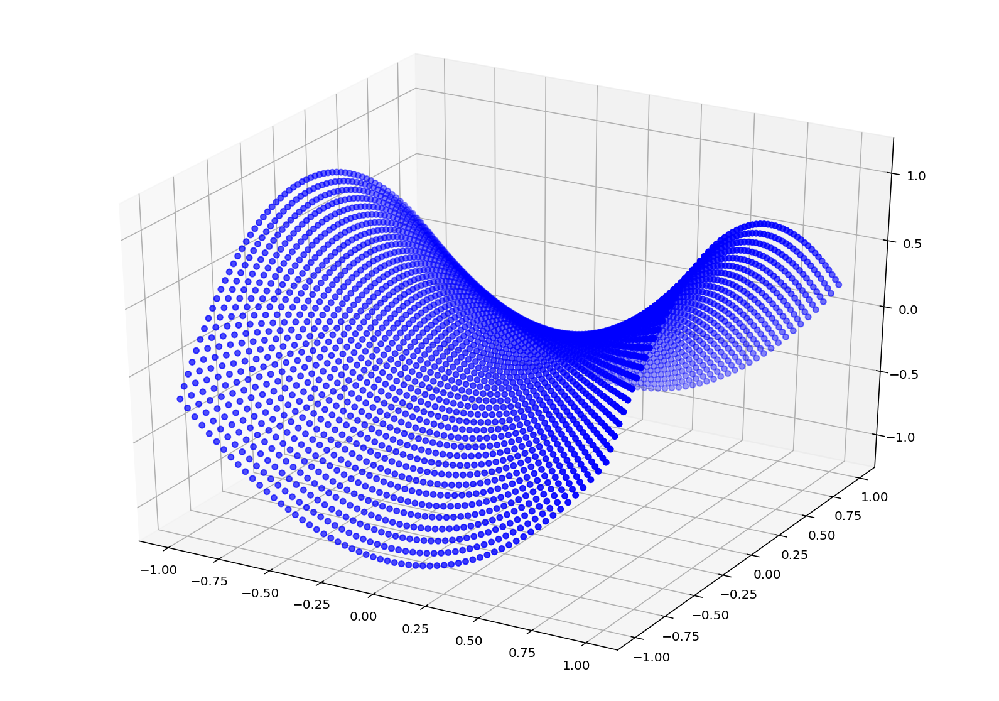

In [4]:
fig1=plt.figure(figsize=(14,10))
ax1=plt.axes(projection="3d")
ax1.scatter3D(x_clean,y_clean,z_clean,c="blue")

## 2. Plot the noisy data in 3D cartesian coordinate system (1pt)

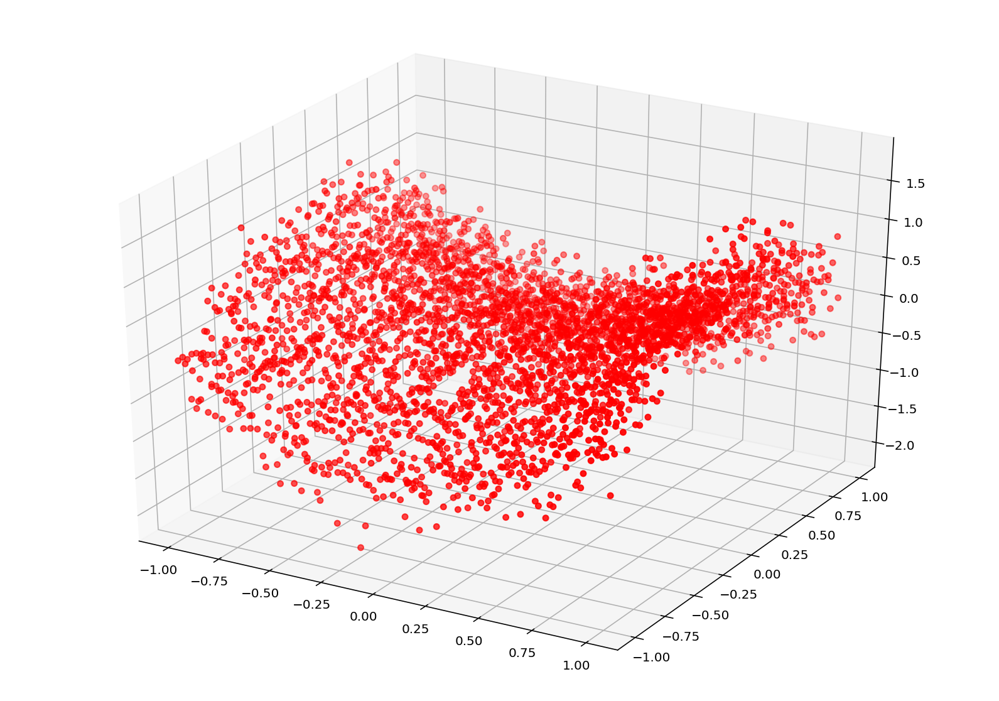

In [5]:
fig2=plt.figure(figsize=(14,10))
ax2=plt.axes(projection="3d")
ax2.scatter3D(x_train,y_train,z_train,c="red")

## 3. Plot the loss curve in the course of gradient descent (2pt)

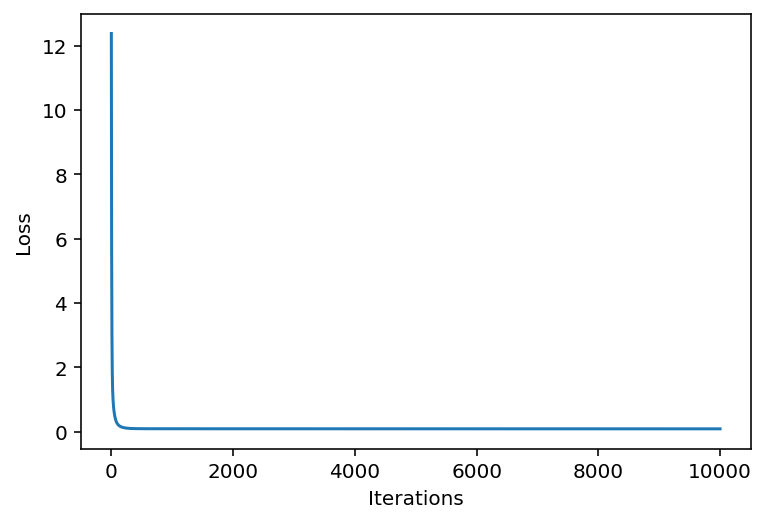

In [45]:
plt.figure(2)
plt.plot(L_iters) # plot the loss curve
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

## 4. Print out the final loss value at convergence of the gradient descent (1pt)

In [43]:
print("loss at convergence = ",L_iters[max_iter-1] ) # plot the last value of the loss


loss at convergence =  0.08848371416691528


## 5. Print out the final model parameter values at convergence of the gradient descent (1pt)

In [46]:
for i,w_ in enumerate(w):
    print("model parameter: w_{0} = {1}".format(i,w_))

model parameter: w_0 = [-0.00170002]
model parameter: w_1 = [-0.00170002]
model parameter: w_2 = [0.02053483]
model parameter: w_3 = [-0.00852468]
model parameter: w_4 = [0.84019494]
model parameter: w_5 = [-0.87015522]
model parameter: w_6 = [0.11996304]
model parameter: w_7 = [0.09331026]
model parameter: w_8 = [0.16034914]
model parameter: w_9 = [-0.11304247]


## 6. Plot the prediction function in 3D cartesian coordinate system (2pt)

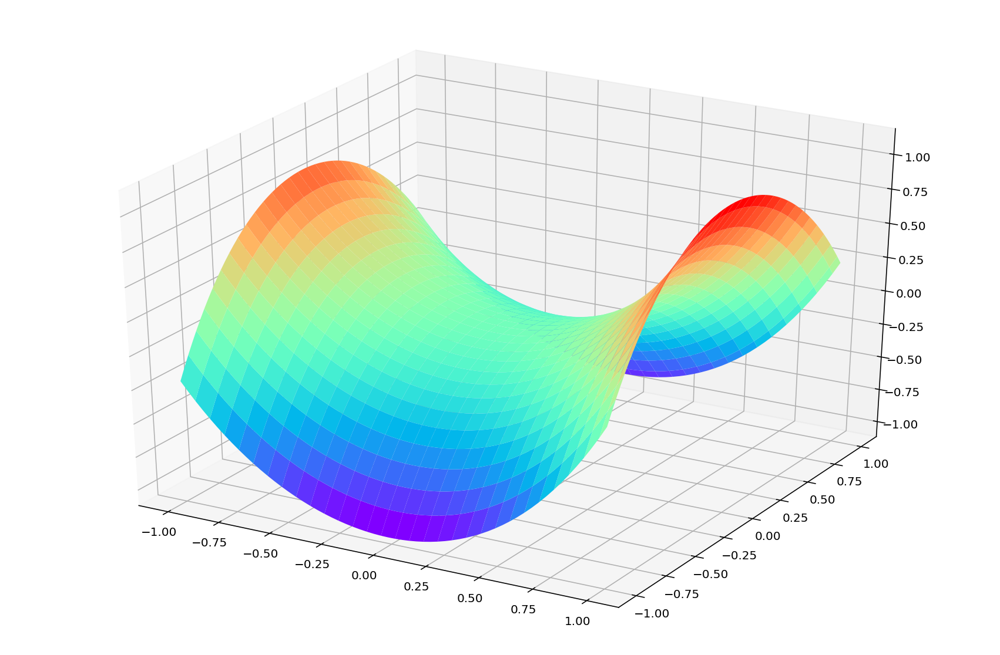

In [47]:
fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot(1, 1, 1, projection='3d')
ax.plot_surface(x_pred,y_pred,z_pred.reshape(60,60),cmap=plt.cm.rainbow)

## 7. Plot the prediction functions superimposed on the training data (2pt)

(-1.0, 1.0)

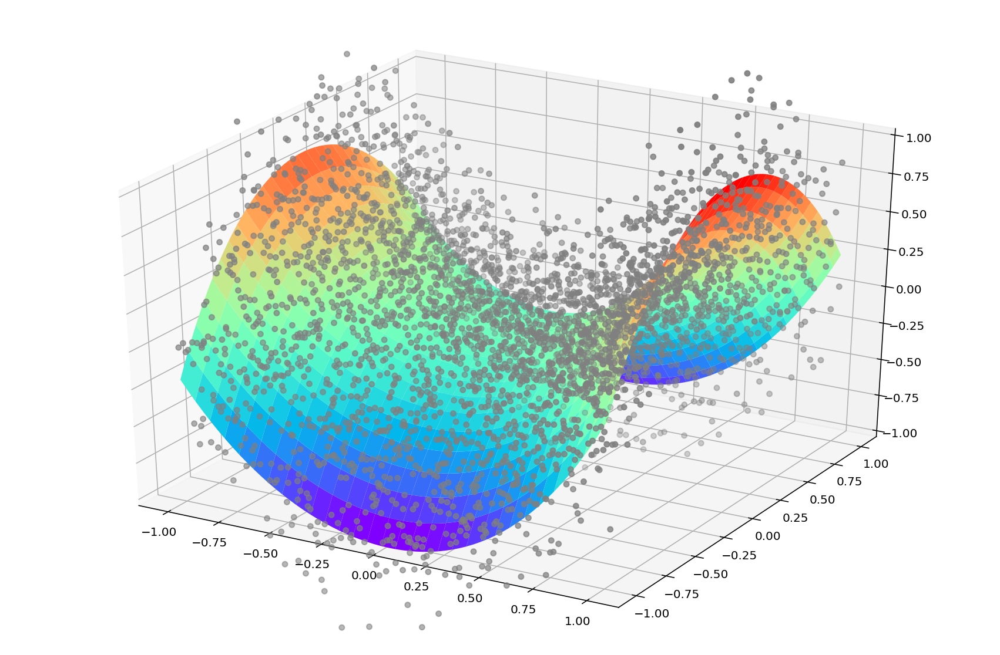

In [48]:
fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot(1, 1, 1, projection='3d')
ax.plot_surface(x_pred,y_pred,z_pred.reshape(60,60),cmap=plt.cm.rainbow)
ax.scatter3D(x_train,y_train,z_train,c="gray")
ax.set_zlim(-1,1)